In [26]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import xarray as xr
import xugrid as xu
from dotenv import dotenv_values

from generator_drainage_units import run_generator_drainage_units

logging.basicConfig(level=logging.INFO)

In [27]:
pd.set_option("future.no_silent_downcasting", True)

In [28]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [29]:
# Define case and base_dir

config = dotenv_values("..\\.env")
base_dir = config["BASE_DIR"]
waterschap = "Waterschap Vallei & Veluwe"

base_dir = Path(config["BASE_DIR"])
dir_basisdata = "0_basisdata"
dir_results = "1_resultaat"

# case_name
# case_name = "vallei_en_veluwe"
# case_name = "geerestein"
# case_name = "hattemerbroek"
# case_name = "pangelerbeek"
case_name = "Leuvenumse_beek"

case_path = Path(base_dir, case_name)

ghg_file_name = "GHG_2000-2010_L1.NC"

In [37]:
gdu = run_generator_drainage_units(
    path=case_path,
    dir_basisdata=dir_basisdata,
    dir_results=dir_results,
    ghg_file_name=ghg_file_name,
    read_results=True,
    write_results=True,
    preprocess=False,
    process=False,
    resolution=2.0,
    depth_waterways=0.2,
    buffer_waterways=2.5,
    iterations=10000,
    smooth_distance=25.0,
)

INFO:root: ### Case "Leuvenumse_beek" ###
INFO:root:     - dir basisdata    = c:\Users\NLHARN\Sweco AB\51024754_Vallei_en_Veluwe_Afwateringseenheden - Documenten\General\Analyse\3_analyses\Leuvenumse_beek\0_basisdata
INFO:root:     - dir results      = c:\Users\NLHARN\Sweco AB\51024754_Vallei_en_Veluwe_Afwateringseenheden - Documenten\General\Analyse\3_analyses\Leuvenumse_beek\1_resultaat
INFO:root:   x read basisdata
INFO:root:     - get dataset HYDROOBJECTEN
INFO:root:     - get dataset OVERIGE_WATERGANGEN
INFO:root:   x read results
INFO:root:     - get dataset AFWATERINGSEENHEDEN
INFO:root:     - get dataset EDGES
INFO:root:     - get dataset GHG_PROCESSED
INFO:root:     - get dataset HYDROOBJECTEN_PROCESSED_0
INFO:root:     - get dataset NODES
INFO:root:     - get dataset OUTFLOW_NODES
INFO:root:     - get dataset OVERIGE_WATERGANGEN_PROCESSED_4
INFO:root:     - use dataset processed hydroobjecten: hydroobjecten_processed_0.gpkg
INFO:root:     - use dataset processed overige_water

 - raster: add raster Afwateringseenheden
 - raster: add raster GHG


INFO:root:   x html file saved: Leuvenumse_beek_drainage_units.html



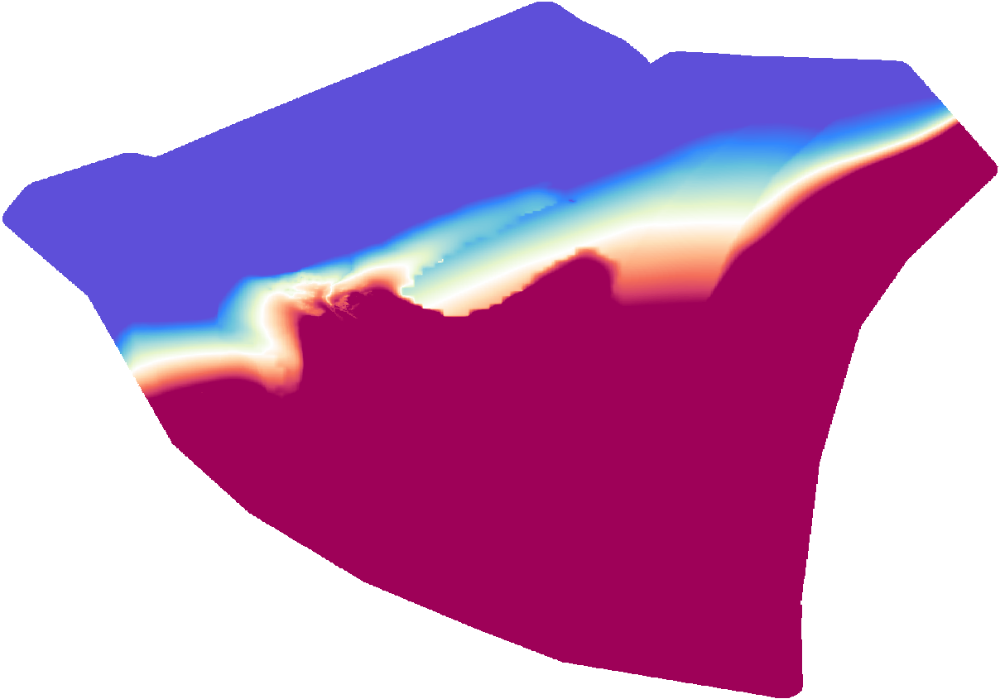

In [45]:
gdu.generate_folium_map(
    order_labels=True,
    zmin=7.5,
    zmax=12.5,
    dx=0.0,
    dy=-9.0,
)